# Interactive RGB Image to Vegetation Matrix Converter

This notebook processes RGB aerial images to extract vegetation quality and water detection for beaver simulation.

**Key Features:**
- Calculate vegetation indices (NDVI, VARI, ExG) from RGB channels
- Handle shadows and terrain variability
- Water stream detection using simple thresholding or SAM2
- Generate normalized vegetation/water matrices

## Workflow Overview:
1. **Configuration** - Select pre-configured region or custom settings
2. **Load RGB Image** - Import aerial imagery
3. **Shadow Correction** - Compensate for lighting variations
4. **Vegetation Indices** - Calculate NDVI, VARI, and Excess Green
5. **Water Detection** - Identify streams using thresholds or SAM2
6. **Combine Results** - Create unified vegetation/water matrix
7. **Visualize & Save** - Review and export processed data

**Note:** SAM2 requires additional setup. See instructions below.

In [1]:
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image

# Add the parent directory to Python path
notebook_dir = os.path.dirname(os.path.abspath('__file__'))
project_root = os.path.abspath(os.path.join(notebook_dir, '../..'))
if project_root not in sys.path:
    sys.path.insert(0, project_root)

# Import RGB processing module
from beaversim.utils.rgb_to_matrix import (
    load_rgb_image,
    calculate_ndvi,
    calculate_vari,
    calculate_excess_green,
    calculate_cwi,
    detect_water_simple,
    detect_water_sam2,
    apply_water_mask,
    apply_shadow_correction,
    save_rgb_outputs,
    visualize_results,
    process_rgb_image_complete
)

# Import colormap for visualization
try:
    from beaversim.ral.backend.modules.module_colors import ColorMaps
    colors = ColorMaps()
    print("✓ Modules loaded successfully")
except ImportError:
    print("⚠ Warning: ColorMaps not available, using default matplotlib colormaps")
    colors = None

✓ Modules loaded successfully


## Configuration: Select Your Example Region

Choose between pre-configured example regions from the Rumney Marsh dataset or set up your own custom region.

In [2]:
# ============================================================================
# SELECT YOUR IMAGE: 'A2_june', 'A2_july', 'A2_august', or 'custom'
# ============================================================================
REGION = 'A2_july'  # Change this to select different images

# Pre-configured settings for example images
IMAGE_CONFIGS = {
    'A2_june': {
        'name': 'Rumney Marsh Site A2 - June 2018',
        'image_path': './example_datasets/RUMNEY_MARSH/A2/A2_06132018.PNG',
        'output_dir': 'output/RumneyMarsh_Boston/RGB/A2_june',
        'target_size': None,  # Keep original size, or set (width, height)
        'shadow_correction': True,
        'use_sam2': False  # Set to True if SAM2 is available
    },
    'A2_july': {
        'name': 'Rumney Marsh Site A2 - July 2018',
        'image_path': './example_datasets/RUMNEY_MARSH/A2/A2_07172018.PNG',
        'output_dir': 'output/RumneyMarsh_Boston/RGB/A2_july',
        'target_size': None,  # Keep original size, or set (width, height)
        'shadow_correction': True,
        'use_sam2': False  # Set to True if SAM2 is available
    },
}

# Load selected configuration
config = IMAGE_CONFIGS[REGION]

print(f"✓ Configuration loaded: {config['name']}")
print(f"  Image: {config['image_path']}")
print(f"  Output: {config['output_dir']}")
print(f"  Shadow correction: {config['shadow_correction']}")
print(f"  SAM2 water detection: {config['use_sam2']}")

✓ Configuration loaded: Rumney Marsh Site A2 - July 2018
  Image: ./example_datasets/RUMNEY_MARSH/A2/A2_07172018.PNG
  Output: output/RumneyMarsh_Boston/RGB/A2_july
  Shadow correction: True
  SAM2 water detection: False


## Step 1: Load RGB Image

Load the aerial RGB image from disk. The image will be analyzed for vegetation patterns and water detection.

Loading RGB image: ./example_datasets/RUMNEY_MARSH/A2/A2_07172018.PNG
  Converting from RGBA to RGB
  Image loaded: (808, 1289, 3) (H x W x C)
  Value range: [1, 255]


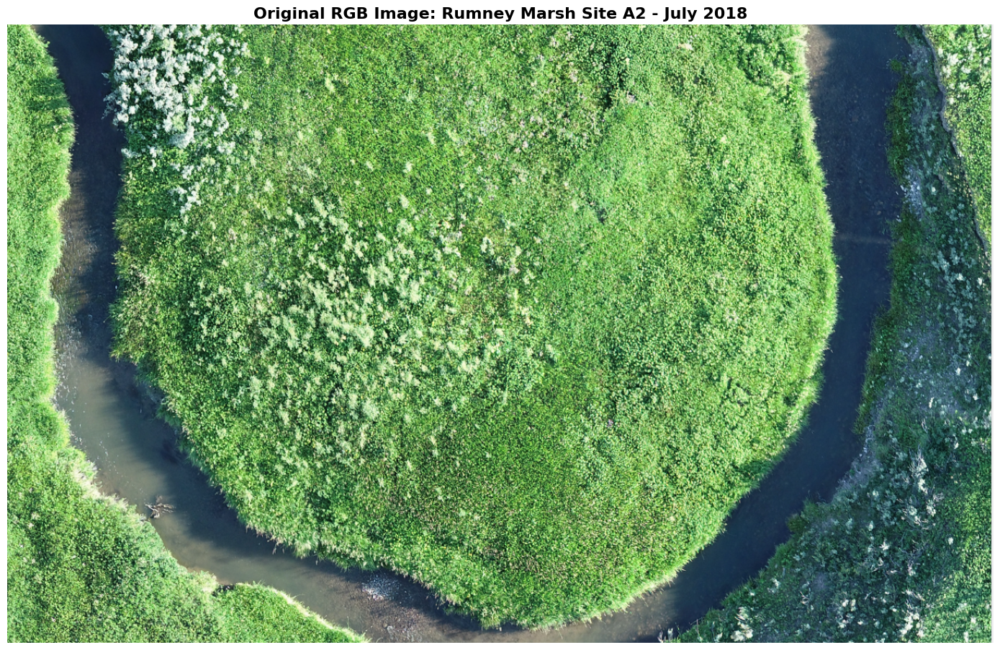


✓ Image loaded successfully
  Shape: (808, 1289, 3) (Height x Width x Channels)
  Original size: (1289, 808) (Width x Height)


In [3]:
# Load the RGB image
rgb, metadata = load_rgb_image(config['image_path'], target_size=config['target_size'])
rgb_original = rgb.copy()

# Display the original image
plt.figure(figsize=(14, 10))
plt.imshow(rgb)
plt.title(f"Original RGB Image: {config['name']}", fontsize=16, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

print(f"\n✓ Image loaded successfully")
print(f"  Shape: {rgb.shape} (Height x Width x Channels)")
print(f"  Original size: {metadata['original_size']} (Width x Height)")

## Step 2: Shadow Correction (Optional)

Apply Contrast Limited Adaptive Histogram Equalization (CLAHE) to reduce shadow effects and improve vegetation index accuracy.

**Methods:**
- `histogram`: Simple histogram equalization per channel
- `clahe`: Adaptive histogram equalization (recommended for aerial images)

Applying shadow correction (method: clahe)...
  Shadow correction applied


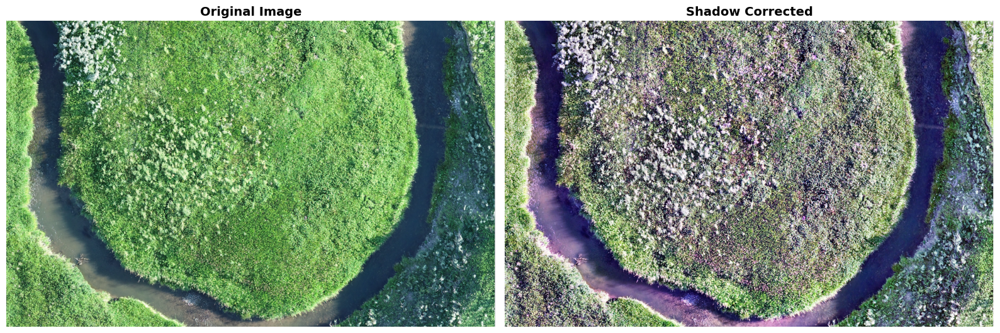

In [4]:
# Apply shadow correction
# Always use rgb_original to avoid applying corrections on top of each other
if config['shadow_correction']:
    rgb_corrected = apply_shadow_correction(rgb_original, method='clahe')
else:
    rgb_corrected = rgb_original.copy()
    print("Shadow correction: Skipped")

# Compare original vs corrected
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

axes[0].imshow(rgb_original)
axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(rgb_corrected)
axes[1].set_title('Shadow Corrected', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.show()

# Use corrected image for further processing
rgb = rgb_corrected

## Step 3: Calculate Vegetation Indices

Calculate four indices from RGB channels - three vegetation indices and one water index:

**NDVI (Normalized Difference Vegetation Index)**
- Formula: `(Green - Red) / (Green + Red)` (visible approximation)
- Range: [-1, 1]
- High values (> 0.3) indicate dense vegetation

**VARI (Visible Atmospherically Resistant Index)**
- Formula: `(Green - Red) / (Green + Red - Blue)`
- More resistant to atmospheric effects and shadows
- Better for aerial imagery with variable lighting

**ExG (Excess Green Index)**
- Formula: `2*Green - Red - Blue`
- Emphasizes green vegetation vs soil/water

- High values indicate water, low values indicate non-water

**CWI (Color Water Index)**- Directly targets water's spectral signature
- Formula: `log(Blue / Red)`

In [5]:
# Calculate vegetation indices
ndvi = calculate_ndvi(rgb, method='visible')
vari = calculate_vari(rgb)
exg = calculate_excess_green(rgb)
cwi = calculate_cwi(rgb)
print("\n✓ All indices calculated (NDVI, VARI, ExG, CWI)")


Calculating NDVI (Normalized Difference Vegetation Index)...
  NDVI range: [-1.000, 1.000]
  NDVI mean: 0.038
  Dense vegetation (>0.3): 3.8%
  Sparse vegetation (0.1-0.3): 19.5%
  Non-vegetated (0-0.1): 39.9%
  Water-like (<0): 34.1%
Calculating VARI (Visible Atmospherically Resistant Index)...
  VARI range: [-1.000, 1.000]
  VARI mean: 0.062
  High vegetation (>0.3): 15.0%
  Moderate vegetation (0.1-0.3): 23.3%
  Low vegetation (0-0.1): 24.6%
  Non-vegetated (<0): 34.5%
Calculating ExG (Excess Green Index)...
  ExG range: [-1.000, 1.000]
  ExG mean: 0.115
  High green (>0.3): 14.6%
  Moderate green (0.1-0.3): 38.6%
  Low green (0-0.1): 20.3%
  Minimal green (<=0): 26.5%
Calculating CWI (Color Water Index)...
  CWI raw range: [-16.760, 16.300]
  CWI normalized range: [-1.000, 1.000]
  CWI normalized mean: 0.020
  Strong water signature (>0.3): 0.0%
  Moderate water signature (0.1-0.3): 0.7%
  Weak water signature (0-0.1): 83.6%
  Non-water (<=0): 15.7%

✓ All indices calculated (NDVI,

## Step 4: Visualize All Indices

Visualize all calculated indices to understand vegetation patterns and identify potential water areas. CWI is particularly useful for directly identifying water bodies.

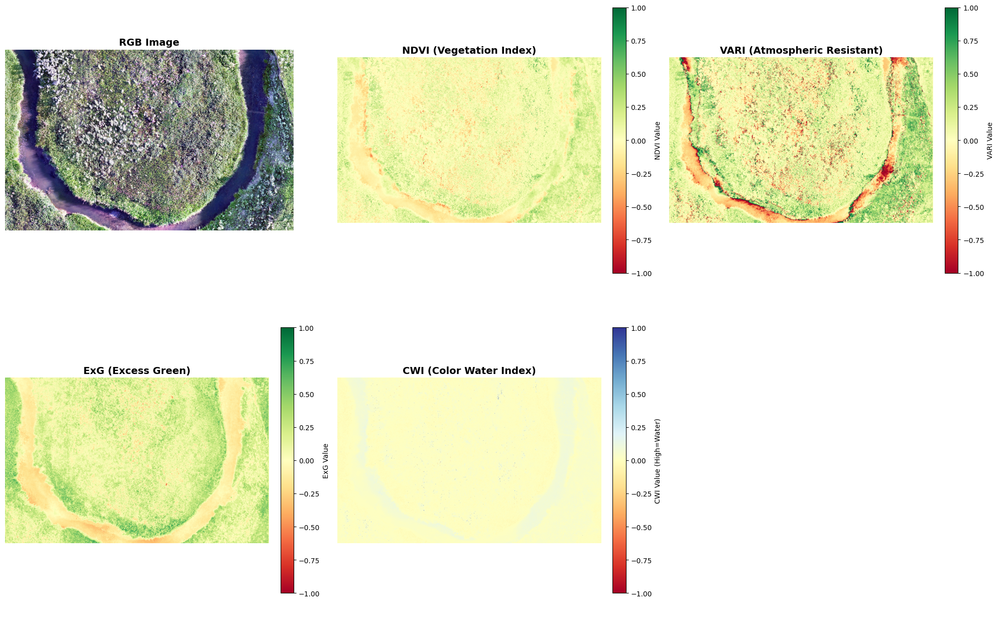

✓ All indices visualized
  Note: CWI (blue colors) directly indicates water, unlike vegetation indices


In [6]:
# Visualize all indices
fig, axes = plt.subplots(2, 3, figsize=(20, 13))

# Original RGB
axes[0, 0].imshow(rgb)
axes[0, 0].set_title('RGB Image', fontsize=14, fontweight='bold')
axes[0, 0].axis('off')

# NDVI
im1 = axes[0, 1].imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
axes[0, 1].set_title('NDVI (Vegetation Index)', fontsize=14, fontweight='bold')
axes[0, 1].axis('off')
cbar1 = plt.colorbar(im1, ax=axes[0, 1], fraction=0.046, pad=0.04)
cbar1.set_label('NDVI Value', fontsize=10)

# VARI
im2 = axes[0, 2].imshow(vari, cmap='RdYlGn', vmin=-1, vmax=1)
axes[0, 2].set_title('VARI (Atmospheric Resistant)', fontsize=14, fontweight='bold')
axes[0, 2].axis('off')
cbar2 = plt.colorbar(im2, ax=axes[0, 2], fraction=0.046, pad=0.04)
cbar2.set_label('VARI Value', fontsize=10)

# ExG
im3 = axes[1, 0].imshow(exg, cmap='RdYlGn', vmin=-1, vmax=1)
axes[1, 0].set_title('ExG (Excess Green)', fontsize=14, fontweight='bold')
axes[1, 0].axis('off')
cbar3 = plt.colorbar(im3, ax=axes[1, 0], fraction=0.046, pad=0.04)
cbar3.set_label('ExG Value', fontsize=10)

# CWI (use blue-to-brown colormap for water)
im4 = axes[1, 1].imshow(cwi, cmap='RdYlBu', vmin=-1, vmax=1)
axes[1, 1].set_title('CWI (Color Water Index)', fontsize=14, fontweight='bold')
axes[1, 1].axis('off')
cbar4 = plt.colorbar(im4, ax=axes[1, 1], fraction=0.046, pad=0.04)
cbar4.set_label('CWI Value (High=Water)', fontsize=10)

# Hide the empty subplot
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

print("✓ All indices visualized")
print("  Note: CWI (blue colors) directly indicates water, unlike vegetation indices")


## Step 4b: Compare All Indices for Water Detection (Optional)

Compare NDVI, VARI, ExG, and CWI side-by-side to decide which index works best for water detection in your image. Each index has different characteristics:
- **NDVI**: Traditional vegetation index, good general purpose (low vegetation = potential water)
- **VARI**: More resistant to shadows and atmospheric effects (low VARI = potential water)
- **ExG**: Emphasizes green vegetation vs non-vegetation (low ExG = potential water)
- **CWI**: Direct water detection using blue/red ratio (high CWI = water)

This step calculates automatic thresholds for all four indices and shows their distributions.

Calculating automatic thresholds for all indices...
Calculating automatic water detection threshold using NDVI...
  Calculated threshold:
    NDVI threshold: -0.029 (Otsu's method)
Calculating automatic water detection threshold using VARI...
  Calculated threshold:
    VARI threshold: -0.099 (Otsu's method)
Calculating automatic water detection threshold using ExG...
  Calculated threshold:
    ExG threshold: 0.025 (Otsu's method)
Calculating automatic water detection threshold using CWI...
  Calculated threshold:
    CWI threshold: 0.003 (Otsu's method)

✓ Automatic thresholds calculated for all indices


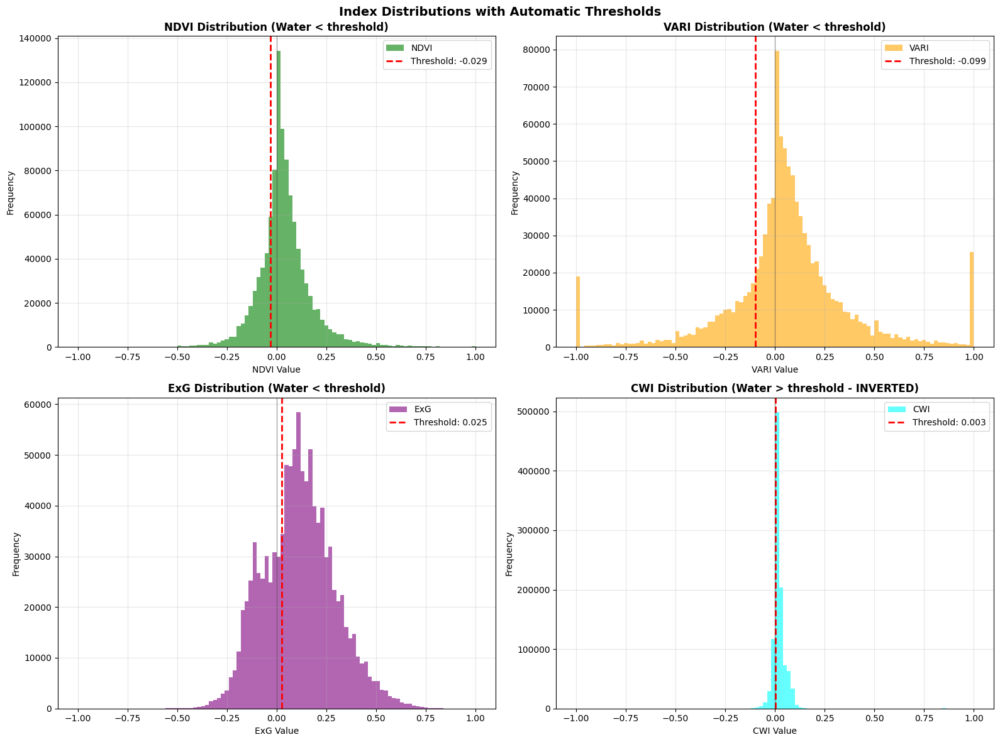


AUTOMATIC THRESHOLDS COMPARISON

Index       Threshold           Detection Logic
----------------------------------------------------------------------
NDVI           -0.029         Water < threshold
VARI           -0.099         Water < threshold
ExG             0.025         Water < threshold
CWI             0.003         Water > threshold



In [7]:
from beaversim.utils.rgb_to_matrix import calculate_automatic_water_thresholds

# Calculate automatic thresholds for all indices
print("Calculating automatic thresholds for all indices...")
auto_thresholds_ndvi = calculate_automatic_water_thresholds(rgb, ndvi, 'NDVI')
auto_thresholds_vari = calculate_automatic_water_thresholds(rgb, vari, 'VARI')
auto_thresholds_exg = calculate_automatic_water_thresholds(rgb, exg, 'ExG')
auto_thresholds_cwi = calculate_automatic_water_thresholds(rgb, cwi, 'CWI')

# Store in dictionary for easy access in Step 5
auto_thresholds = {
    'NDVI': auto_thresholds_ndvi,
    'VARI': auto_thresholds_vari,
    'ExG': auto_thresholds_exg,
    'CWI': auto_thresholds_cwi
}

print("\n✓ Automatic thresholds calculated for all indices")

# Extract flattened index data for visualization
ndvi_flat = ndvi.flatten()
vari_flat = vari.flatten()
exg_flat = exg.flatten()
cwi_flat = cwi.flatten()

# Create 2x2 grid of histograms showing index distributions and automatic thresholds
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# NDVI histogram
axes[0, 0].hist(ndvi_flat, bins=100, color='green', alpha=0.6, label='NDVI')
axes[0, 0].axvline(auto_thresholds_ndvi['index_threshold'], color='red', linestyle='--', 
                   linewidth=2, label=f"Threshold: {auto_thresholds_ndvi['index_threshold']:.3f}")
axes[0, 0].axvline(0, color='black', linestyle='-', linewidth=1, alpha=0.3)
axes[0, 0].set_xlabel('NDVI Value')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].set_title('NDVI Distribution (Water < threshold)', fontweight='bold', fontsize=12)
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# VARI histogram
axes[0, 1].hist(vari_flat, bins=100, color='orange', alpha=0.6, label='VARI')
axes[0, 1].axvline(auto_thresholds_vari['index_threshold'], color='red', linestyle='--', 
                   linewidth=2, label=f"Threshold: {auto_thresholds_vari['index_threshold']:.3f}")
axes[0, 1].axvline(0, color='black', linestyle='-', linewidth=1, alpha=0.3)
axes[0, 1].set_xlabel('VARI Value')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_title('VARI Distribution (Water < threshold)', fontweight='bold', fontsize=12)
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# ExG histogram
axes[1, 0].hist(exg_flat, bins=100, color='purple', alpha=0.6, label='ExG')
axes[1, 0].axvline(auto_thresholds_exg['index_threshold'], color='red', linestyle='--', 
                   linewidth=2, label=f"Threshold: {auto_thresholds_exg['index_threshold']:.3f}")
axes[1, 0].axvline(0, color='black', linestyle='-', linewidth=1, alpha=0.3)
axes[1, 0].set_xlabel('ExG Value')
axes[1, 0].set_ylabel('Frequency')
axes[1, 0].set_title('ExG Distribution (Water < threshold)', fontweight='bold', fontsize=12)
axes[1, 0].legend()
axes[1, 0].grid(alpha=0.3)

# CWI histogram
axes[1, 1].hist(cwi_flat, bins=100, color='cyan', alpha=0.6, label='CWI')
axes[1, 1].axvline(auto_thresholds_cwi['index_threshold'], color='red', linestyle='--', 
                   linewidth=2, label=f"Threshold: {auto_thresholds_cwi['index_threshold']:.3f}")
axes[1, 1].axvline(0, color='black', linestyle='-', linewidth=1, alpha=0.3)
axes[1, 1].set_xlabel('CWI Value')
axes[1, 1].set_ylabel('Frequency')
axes[1, 1].set_title('CWI Distribution (Water > threshold - INVERTED)', fontweight='bold', fontsize=12)
axes[1, 1].legend()
axes[1, 1].grid(alpha=0.3)

plt.suptitle('Index Distributions with Automatic Thresholds', 
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Summary comparison table
print("\n" + "="*70)
print("AUTOMATIC THRESHOLDS COMPARISON")
print("="*70)
print(f"\n{'Index':<8} {'Threshold':>12} {'Detection Logic':>25}")
print("-"*70)
for idx_name in ['NDVI', 'VARI', 'ExG']:
    thresholds = auto_thresholds[idx_name]
    print(f"{idx_name:<8} {thresholds['index_threshold']:>12.3f} {'Water < threshold':>25}")
print(f"{'CWI':<8} {auto_thresholds['CWI']['index_threshold']:>12.3f} {'Water > threshold':>25}")

print("\n" + "="*70)

## Step 5: Water Detection

Detect water bodies using either simple thresholding or SAM2 (Segment Anything Model 2).

### Simple Method:
Uses color thresholds and NDVI values to identify water:
- Blue channel higher than red/green
- Low NDVI (< 0)
- Moderate brightness

### SAM2 Method (Advanced):
Uses Meta's SAM2 for accurate segmentation. Requires:
```bash
pip install git+https://github.com/facebookresearch/sam2.git
```
Download checkpoint from: https://github.com/facebookresearch/sam2

✓ Manual threshold configured
  Index threshold: -0.010
Using MANUAL threshold (from Step 4c)
  Selected index: ExG
  Threshold: -0.010
Using ExG threshold for water detection...
Detecting water using ExG threshold...
  Using ExG < -0.010 (vegetation index: low values = water)
  Water pixels detected: 259,811 (24.95%)

✓ Water detection complete
  Method: Simple thresholding (ExG)


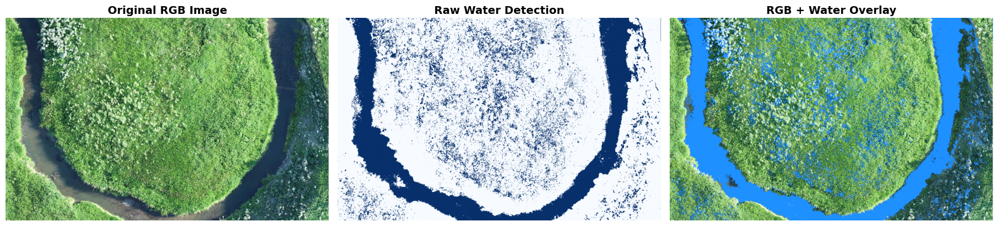

  Water coverage: 24.95% (259,811 pixels)


In [8]:
from beaversim.utils.rgb_to_matrix import calculate_automatic_water_thresholds

# Water detection configuration
use_sam2 = config['use_sam2']
sam2_checkpoint = '/home/fedeoli/Documents/Work/Projects/beavers/beaverbot/sam2_hiera_large.pt'  # Set path to SAM2 checkpoint if available

# Choose which index to use for water detection
# Options: 'NDVI', 'VARI', 'ExG', or 'CWI'
# - NDVI: Traditional choice, good general purpose (low = potential water)
# - VARI: Better in shadowy areas (more atmospheric resistant, low = potential water)
# - ExG: Emphasizes green, low ExG indicates non-vegetation
# - CWI: Direct water index (high = water, inverted logic from vegetation indices)
vegetation_index_choice = 'ExG'  # Change this to experiment

# Select the appropriate index
if vegetation_index_choice == 'NDVI':
    veg_index = ndvi
elif vegetation_index_choice == 'VARI':
    veg_index = vari
elif vegetation_index_choice == 'ExG':
    veg_index = exg
elif vegetation_index_choice == 'CWI':
    veg_index = cwi
else:
    print(f"Unknown index '{vegetation_index_choice}', using NDVI")
    veg_index = ndvi
    vegetation_index_choice = 'NDVI'
    
# ============================================================================
# MANUAL THRESHOLD OVERRIDE (Optional)
# ============================================================================
# Set use_manual_threshold = True to override the automatic threshold
# Set use_manual_threshold = False to use automatic value from Step 4b
use_manual_threshold = True

if use_manual_threshold:
    # Manual threshold value - adjust based on the histogram from Step 4b
    # This will be used in Step 5 for water detection
    
    manual_index_threshold = -0.01      # Threshold for vegetation index
                                      # For NDVI/VARI/ExG: water when index < threshold (upper bound)
                                      # For CWI: water when index > threshold (lower bound)
    
    print("✓ Manual threshold configured")
    print(f"  Index threshold: {manual_index_threshold:.3f}")
else:
    print("✓ Using automatic threshold from Step 4b")
    print("  (Set use_manual_threshold = True above to override)")

# ============================================================================
# THRESHOLD SELECTION
# ============================================================================
# Determine which threshold to use: manual (from Step 4c) or automatic (from Step 4b)
if 'use_manual_threshold' in locals() and use_manual_threshold:
    # Use manual threshold from Step 4c
    index_threshold = manual_index_threshold
    print("Using MANUAL threshold (from Step 4c)")
elif 'auto_thresholds' in locals():
    # Use automatic threshold from Step 4b for the selected index
    index_threshold = auto_thresholds[vegetation_index_choice]['index_threshold']
    print("Using AUTOMATIC threshold (from Step 4b)")
else:
    # Fallback: calculate automatic threshold on-the-fly if Step 4b wasn't run
    print("Step 4b not run - calculating automatic threshold...")        
    thresholds_dict = calculate_automatic_water_thresholds(rgb, veg_index, vegetation_index_choice)
    index_threshold = thresholds_dict['index_threshold']

print(f"  Selected index: {vegetation_index_choice}")
print(f"  Threshold: {index_threshold:.3f}")

# Detect water
if use_sam2 and sam2_checkpoint:
    print("Using SAM2 for water detection...")
    water_mask_raw = detect_water_sam2(rgb, checkpoint=sam2_checkpoint, device='cpu')
else:
    print(f"Using {vegetation_index_choice} threshold for water detection...")
    water_mask_raw = detect_water_simple(
        rgb, 
        veg_index,
        index_name=vegetation_index_choice,
        index_threshold=index_threshold
    )

# Store raw detection for visualization (will be post-processed later)
water_mask = water_mask_raw.copy()

print(f"\n✓ Water detection complete")
print(f"  Method: {'SAM2' if use_sam2 else f'Simple thresholding ({vegetation_index_choice})'}")

# Visualize raw water detection
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Original image
axes[0].imshow(rgb_original)
axes[0].set_title('Original RGB Image', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Water mask (raw detection)
axes[1].imshow(water_mask_raw, cmap='Blues')
axes[1].set_title('Raw Water Detection', fontsize=14, fontweight='bold')
axes[1].axis('off')

# RGB with water overlay
rgb_overlay = rgb_original.copy()
rgb_overlay[water_mask_raw] = [30, 144, 255]  # Dodger blue for water
axes[2].imshow(rgb_overlay)
axes[2].set_title('RGB + Water Overlay', fontsize=14, fontweight='bold')
axes[2].axis('off')

plt.tight_layout()
plt.show()

water_pixels = np.sum(water_mask_raw)
total_pixels = water_mask_raw.size
print(f"  Water coverage: {100*water_pixels/total_pixels:.2f}% ({water_pixels:,} pixels)")

## Step 6: Post-Process Water Mask

Apply morphological operations to clean up the water detection:
1. **Opening (erosion → dilation)**: Removes small isolated false positives without permanently shrinking legitimate water bodies
2. **Closing (dilation → erosion)**: Fills small holes and connects nearby water fragments without adding false positives outside water regions

Adjust the kernel sizes based on your image resolution and water feature sizes. Smaller kernels (3-7) for fine details, larger kernels (9-15) for aggressive cleanup.

Input from Step 5: 259,811 water pixels detected (raw detection)

Applying morphological post-processing to water mask...
  Phase 1: Applying 2 opening(s) (erosion + dilation)...
    Opening 1 (kernel=10): Removed 110,444 noise pixels
    Opening 2 (kernel=15): Removed 3,798 noise pixels
  Phase 3: Applying 2 morphological closing(s)...
  Summary: 259,811 → 143,253 pixels (-44.9%)


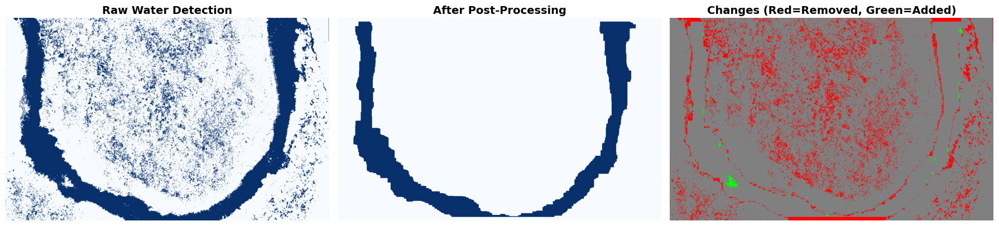

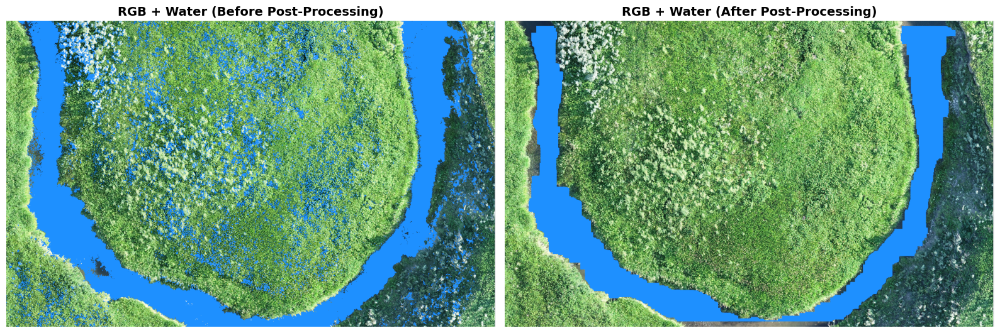


✓ Post-processing complete
  Final water coverage: 13.75% (143,253 pixels)


In [9]:
# Import post-processing function
from beaversim.utils.rgb_to_matrix import postprocess_water_mask

# Verify water_mask_raw exists from previous step
if 'water_mask_raw' not in locals():
    raise RuntimeError("Error: water_mask_raw not found. Please run Step 5 (water detection) first!")

initial_water_pixels = np.sum(water_mask_raw)
print(f"Input from Step 5: {initial_water_pixels:,} water pixels detected (raw detection)")

# Apply morphological post-processing
# Strategy: Opening (remove noise) → Closing (connect fragments)
print("\nApplying morphological post-processing to water mask...")

# Configuration: Adjust these kernel sizes based on your needs
# - Smaller kernels (3-5): Keep fine details, gentle cleanup
# - Larger kernels (7-15): More aggressive noise removal and connection
water_mask = postprocess_water_mask(
    water_mask_raw,
    opening_sizes=[10, 15],      # List of opening kernels (removes small false positives)
    median_sizes=[],        # List of median filter kernels (optional, usually not needed with opening)
    closing_sizes=[30, 30],      # List of closing kernels (fills holes, connects fragments)
    apply_opening=True,
    apply_median=False,     # Median less predictable than opening for binary masks
    apply_closing=True
)

# Compare before and after - Two visualizations
# 1. Side-by-side comparison of masks
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Raw detection
axes[0].imshow(water_mask_raw, cmap='Blues')
axes[0].set_title('Raw Water Detection', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Post-processed
axes[1].imshow(water_mask, cmap='Blues')
axes[1].set_title('After Post-Processing', fontsize=14, fontweight='bold')
axes[1].axis('off')

# Difference (what changed)
difference = water_mask.astype(int) - water_mask_raw.astype(int)
# Red = removed, Green = added, Gray = unchanged
diff_rgb = np.zeros((*water_mask.shape, 3), dtype=np.uint8)
diff_rgb[difference == -1] = [255, 0, 0]    # Removed: red
diff_rgb[difference == 1] = [0, 255, 0]     # Added: green
diff_rgb[difference == 0] = [128, 128, 128] # Unchanged: gray
axes[2].imshow(diff_rgb)
axes[2].set_title('Changes (Red=Removed, Green=Added)', fontsize=14, fontweight='bold')
axes[2].axis('off')

plt.tight_layout()
plt.show()

# 2. RGB overlays comparison
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# Before post-processing
rgb_overlay_raw = rgb_original.copy()
rgb_overlay_raw[water_mask_raw] = [30, 144, 255]
axes[0].imshow(rgb_overlay_raw)
axes[0].set_title('RGB + Water (Before Post-Processing)', fontsize=14, fontweight='bold')
axes[0].axis('off')

# After post-processing
rgb_overlay_clean = rgb_original.copy()
rgb_overlay_clean[water_mask] = [30, 144, 255]
axes[1].imshow(rgb_overlay_clean)
axes[1].set_title('RGB + Water (After Post-Processing)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.show()

# Statistics
water_pixels_final = np.sum(water_mask)
total_pixels = water_mask.size
print(f"\n✓ Post-processing complete")
print(f"  Final water coverage: {100*water_pixels_final/total_pixels:.2f}% ({water_pixels_final:,} pixels)")

## Step 7: Create Final Matrix

Create the final output matrix using the selected vegetation index and water mask:
- **Land pixels**: Values from the selected vegetation index (normalized to [0, 1])
- **Water pixels**: Set to -1 to indicate water bodies

In [10]:
# Normalize the selected vegetation index to [0, 1] range for land areas
# Different indices have different original ranges:
# - NDVI, VARI, CWI: [-1, 1] -> normalize to [0, 1]  
# - ExG: already [0, 1] approximately

if vegetation_index_choice in ['NDVI', 'VARI', 'CWI']:
    # Normalize from [-1, 1] to [0, 1]
    vegetation_matrix = (veg_index + 1) / 2.0
else:  # ExG
    # Already in [0, 1] range, just clip to be safe
    vegetation_matrix = np.clip(veg_index, 0, 1)

# Create final matrix: land pixels keep vegetation values, water pixels = -1
combined_matrix = vegetation_matrix.copy()
combined_matrix[water_mask] = -1

print(f"✓ Final matrix created using {vegetation_index_choice}")
print(f"  Shape: {combined_matrix.shape}")
print(f"  Land value range: [0.0, 1.0] (normalized {vegetation_index_choice})")
print(f"  Water value: -1.0")
print(f"  Land pixels: {np.sum(~water_mask):,}")
print(f"  Water pixels: {np.sum(water_mask):,}")

✓ Final matrix created using ExG
  Shape: (808, 1289)
  Land value range: [0.0, 1.0] (normalized ExG)
  Water value: -1.0
  Land pixels: 898,259
  Water pixels: 143,253


## Step 8: Comprehensive Visualization

View all processing stages side-by-side to verify the results.

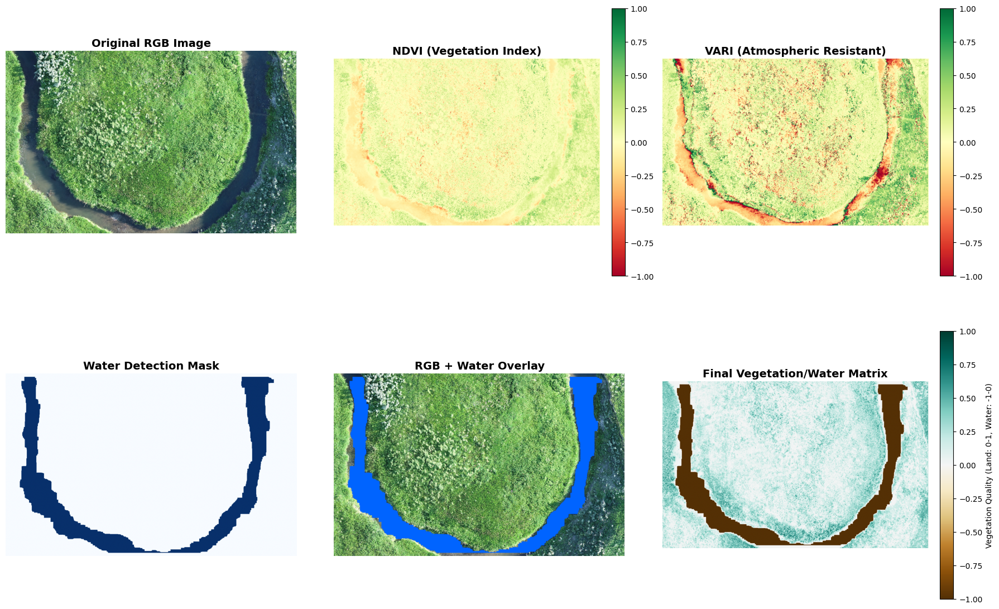

✓ Visualization complete


In [11]:
# Create comprehensive visualization
visualize_results(rgb_original, ndvi, vari, water_mask, combined_matrix, save_path=None)

print("✓ Visualization complete")

## Step 9: Save Outputs

Save all processed data including the final matrix, individual indices, water mask, and metadata.

In [13]:
# Add processing parameters to metadata
metadata['processing_parameters'] = {
    'shadow_correction': config['shadow_correction'],
    'use_sam2': config['use_sam2'],    
    'water_detection_method': 'SAM2' if config['use_sam2'] else 'simple_thresholding'
}

# Save all outputs
save_rgb_outputs(
    config['output_dir'],
    combined_matrix,
    ndvi,
    vari,
    water_mask,
    metadata,
    rgb_original
)

print("\n" + "="*80)
print("✓ PROCESSING COMPLETE!")
print("="*80)
print(f"  All files saved to: {config['output_dir']}")
print(f"  Matrix shape: {combined_matrix.shape}")
print(f"  Land pixels: {np.sum(~water_mask):,}")
print(f"  Water pixels: {np.sum(water_mask):,}")


✓ Saved to output/RumneyMarsh_Boston/RGB/A2_july:
  - vegetation_matrix.npy: (808, 1289)
  - ndvi.npy: (808, 1289)
  - vari.npy: (808, 1289)
  - water_mask.npy: (808, 1289)
  - processing_metadata.json

✓ PROCESSING COMPLETE!
  All files saved to: output/RumneyMarsh_Boston/RGB/A2_july
  Matrix shape: (808, 1289)
  Land pixels: 898,259
  Water pixels: 143,253


## Optional: Load and Verify Saved Data

Verify that the saved files can be loaded correctly.

In [14]:
# Load saved data
import json

output_dir = config['output_dir']

loaded_matrix = np.load(f"{output_dir}/vegetation_matrix.npy")
loaded_ndvi = np.load(f"{output_dir}/ndvi.npy")
loaded_vari = np.load(f"{output_dir}/vari.npy")
loaded_water_mask = np.load(f"{output_dir}/water_mask.npy")

with open(f"{output_dir}/processing_metadata.json", 'r') as f:
    loaded_metadata = json.load(f)

print("✓ Data loaded successfully")
print(f"  Matrix shape: {loaded_matrix.shape}")
print(f"  NDVI shape: {loaded_ndvi.shape}")
print(f"  VARI shape: {loaded_vari.shape}")
print(f"  Water mask shape: {loaded_water_mask.shape}")
print(f"\nMetadata:")
for key, value in loaded_metadata['processing_parameters'].items():
    print(f"  {key}: {value}")

✓ Data loaded successfully
  Matrix shape: (808, 1289)
  NDVI shape: (808, 1289)
  VARI shape: (808, 1289)
  Water mask shape: (808, 1289)

Metadata:
  shadow_correction: True
  use_sam2: False
  water_detection_method: simple_thresholding


## Notes and Tips

### About SAM2 (Segment Anything Model 2)

SAM2 is Meta's advanced segmentation model that can detect water streams with high accuracy. To use it:

**Installation:**
```bash
pip install git+https://github.com/facebookresearch/sam2.git
```

**Download checkpoint:**
Visit https://github.com/facebookresearch/sam2 and download a model checkpoint (e.g., `sam2_hiera_large.pt`)

**Enable in config:**
Set `use_sam2: True` and provide checkpoint path in the water detection cell.

### Adjusting Parameters

**Vegetation Weights:**
- Increase NDVI weight for standard vegetation detection
- Increase VARI weight for better atmospheric/shadow resistance
- Increase ExG weight to emphasize green vegetation

**Water Detection Thresholds:**
- `blue_threshold`: Lower values detect more water (try 80-120)
- `ndvi_threshold`: Higher values allow more vegetation in water (try -0.1 to 0.1)
- `brightness_max`: Adjust based on image lighting (try 150-250)

### Handling Shadows

Shadows are a major challenge in aerial imagery. This pipeline addresses them through:
1. **CLAHE shadow correction** - Normalizes local contrast
2. **VARI index** - More resistant to atmospheric effects than NDVI
3. **Weighted combination** - Reduces impact of individual index artifacts

### Next Steps

The generated `vegetation_matrix.npy` can be used directly in beaver simulation as a quality map where:
- High values (close to 1) indicate good vegetation/habitat
- Low positive values indicate sparse vegetation
- Negative values indicate water bodies